<a href="https://colab.research.google.com/github/T-jorven/dog-breed-identification-TensorFlow/blob/main/dog_breed_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


## Using Transfer Learning and TensorFlow 2.0 to Classify Dog Breeds

This project applies **deep learning and transfer learning** to identify dog breeds from images. Using the **Kaggle Dog Breed Identification** dataset, the model is trained on **10,000+ labeled images** covering **120 dog breeds**.

The task is a **multi-class image classification** problem, where the goal is to predict one breed out of many possible classes. Similar techniques are widely used in real-world applications such as autonomous driving and automated image tagging.

### Approach

- **Data source:** Kaggle Dog Breed Identification dataset  
- **Framework:** TensorFlow 2.x  
- **Modeling technique:** Transfer learning with pretrained models from **TensorFlow Hub**

### Workflow

1. Data acquisition and loading  
2. Data preprocessing (train/validation/test split, feature–label preparation)  
3. Model selection and training (`tf.keras`, TensorFlow Hub, callbacks)  
4. Model evaluation and prediction analysis  
5. Iterative improvement through controlled experimentation  
6. Model saving, sharing, and reloading  

Transfer learning is used to leverage pretrained image recognition models, significantly reducing training time while achieving strong performance without training a model from scratch.



In [32]:
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


# **Get the Workspace Ready**

* Import TensorFlow and TensorFlow Hub
* Use GPU


In [37]:
# import tools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [38]:
#import Tensorflow into the environment
import tensorflow as tf
print('Tf Version:', tf.__version__)
import tensorflow_hub as hub
print('Hub Version:', hub.__version__)

#Check GPU
print("GPU", "available" if tf.config.list_physical_devices else "not available")

Tf Version: 2.19.0
Hub Version: 0.16.1
GPU available


In [39]:
# Changing data to tensors
labels_csv = pd.read_csv("/content/drive/MyDrive/dog-breed-identification-2/labels.csv")
print(labels_csv.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [40]:
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


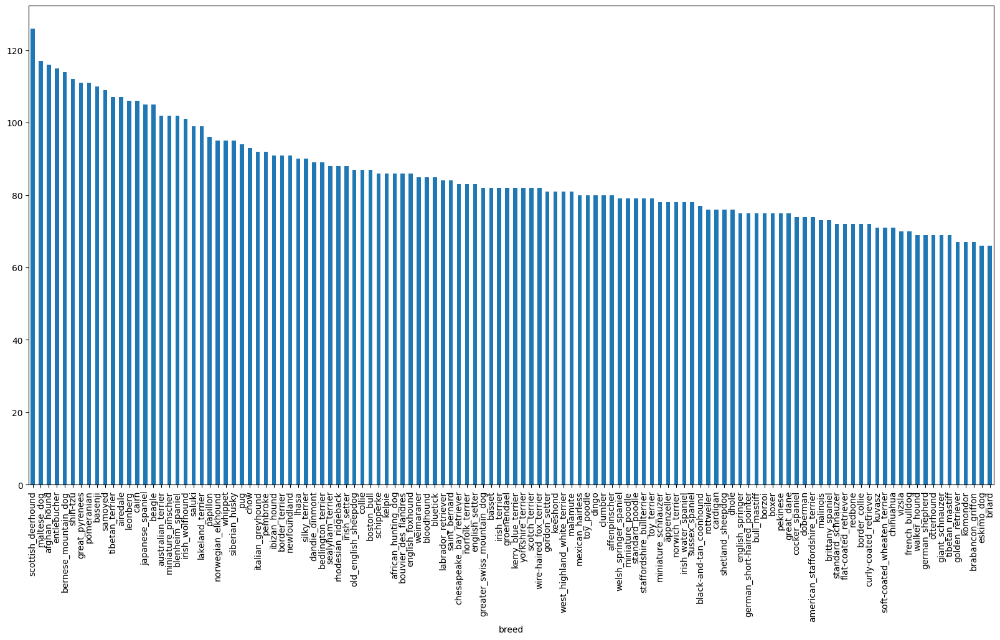

In [41]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

# Getting images and their labels

Since we've got the image ID's and their labels in a DataFrame (labels_csv), we'll use it to create:

* A list a filepaths to training images
* An array of all labels
* An array of all unique labels

In [83]:
# Check whether number of filenames matches number of actual image files
import os

# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/dog-breed-identification-2/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

print(len(os.listdir("/content/drive/MyDrive/dog-breed-identification-2/train/")))
print(len(filenames))


10222
10222


In [84]:

labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [85]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


In [86]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [87]:
# Example: Turn one label into an array of booleans
print(labels[0])
labels[0] == unique_breeds # use comparison operator to create boolean array

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [88]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

# Creating validation set

Since the dataset from Kaggle doesn't come with a validation set (a split of the data we can test our model on before making final predicitons on the test set), let's make one.

We could use Scikit-Learn's train_test_split function or we could simply make manual splits of the data.

For accessibility later, let's save our filenames variable to X (data) and our labels to y.

In [89]:
# Setup X & y variables
X = filenames
y = boolean_labels

# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [90]:
# Check out the training data (image file paths and labels)
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/dog-breed-identification-2/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog-breed-identification-2/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dog-breed-identification-2/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dog-breed-identification-2/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dog-breed-identification-2/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

# Preprocessing images (turning images into Tensors)

Our labels are in numeric format but our images are still just file paths.

Since we're using TensorFlow, our data has to be in the form of Tensors.

A Tensor is a way to represent information in numbers. If you're familar with NumPy arrays (you should be), a Tensor can be thought of as a combination of NumPy arrays, except with the special ability to be used on a GPU.

Because of how TensorFlow stores information (in Tensors), it allows machine learning and deep learning models to be run on GPUs (generally faster at numerical computing).

To preprocess our images into Tensors we're going to write a function which does a few things:

* Takes an image filename as input.
* Uses TensorFlow to read the file and save it to a variable, image.
* Turn our image (a jpeg file) into Tensors.
* Resize the image to be of shape (224, 224).
* Return the modified image.

In [91]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread("/content/drive/MyDrive/dog-breed-identification-2/train/000bec180eb18c7604dcecc8fe0dba07.jpg") # read in an image
image.shape

(375, 500, 3)

In [92]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[108,  46,   0],
        [152,  92,  42],
        [180, 120,  70],
        ...,
        [176, 144,  69],
        [189, 157,  82],
        [214, 182, 107]],

       [[151,  93,  47],
        [179, 121,  75],
        [167, 111,  64],
        ...,
        [167, 136,  56],
        [172, 139,  60],
        [188, 157,  77]]], dtype=uint8)>

In [93]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

# Creating data batches


In [94]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [95]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [96]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [97]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing data batches

In [98]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

    plt.show()


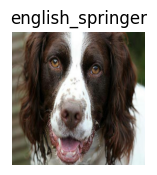

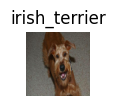

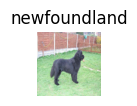

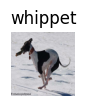

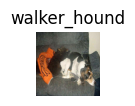

...

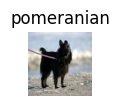

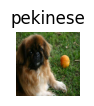

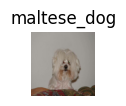

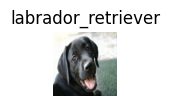

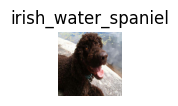

In [99]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)


# Creating and training a model


Before we build a model, there are a few things we need to define:

* The input shape (images, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.


In [100]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [130]:
import tensorflow as tf

IMG_SIZE = (224, 224)
NUM_CLASSES = 120

def create_model():
    base = tf.keras.applications.MobileNetV2(
        input_shape=(*IMG_SIZE, 3),
        include_top=False,
        weights="imagenet"
    )
    base.trainable = False

    inputs = tf.keras.Input(shape=(*IMG_SIZE, 3), dtype=tf.float32, name="image")

    # Your dataset is 0..1 -> convert to -1..1 for MobileNetV2
    x = (inputs * 2.0) - 1.0

    x = base(x, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(NUM_CLASSES, activation="softmax")(x)

    model = tf.keras.Model(inputs, outputs)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss="categorical_crossentropy",
        metrics=["accuracy"]
    )
    return model

model = create_model()
model.summary()





Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ image (InputLayer)              │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ multiply (Multiply)             │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_5 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# Creating callbacks

In [131]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [132]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [133]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

# Training a model (on a subset of data)

Our first model is only going to be trained on 1000 images. Or trained on 800 images and then validated on 200 images, meaning 1000 images total or about 10% of the total data.



In [134]:
# Check again if GPU is available (otherwise computing will take a looooonnnnggggg time)
print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESS!!!!)


In [135]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [136]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])

  return model

In [137]:
# Fit the model to the data
model = train_model()

Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 20s 475ms/step - accuracy: 0.0450 - loss: 4.7586 - val_accuracy: 0.2800 - val_loss: 3.5593
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - accuracy: 0.5064 - loss: 2.4514 - val_accuracy: 0.5150 - val_loss: 2.3520
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 190ms/step - accuracy: 0.8020 - loss: 1.1560 - val_accuracy: 0.5900 - val_loss: 1.8247
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - accuracy: 0.9293 - loss: 0.6072 - val_accuracy: 0.6450 - val_loss: 1.5838
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - accuracy: 0.9681 - loss: 0.3919 - val_accuracy: 0.6550 - val_loss: 1.4484
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 6s 172ms/step - accuracy: 0.9874 - loss: 0.2676 - val_accuracy: 0.6650 - val_loss: 1.3656
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 5s 172ms/step - accuracy: 0.9937 - loss: 0.2193 - val_accuracy: 0.6850 - val_loss: 1.3169
Epoch 8/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 4s 181ms/step - accuracy: 0.9974 - loss: 0.1494 - val_acc

# Making and evaluating predictions using a trained model

In [138]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 ━━━━━━━━━━━━━━━━━━━━ 9s 751ms/step


array([[1.88193948e-03, 4.20401921e-04, 5.98317303e-04, ...,
        1.47176353e-04, 1.68003418e-04, 3.94665403e-03],
       [5.23815537e-03, 8.33734311e-03, 8.19808710e-03, ...,
        3.68958426e-04, 7.43271876e-03, 7.90518170e-05],
       [2.98033751e-06, 8.48386626e-05, 2.71121844e-05, ...,
        5.67816096e-05, 2.31857266e-05, 3.84773419e-04],
       ...,
       [1.42131403e-05, 1.61553864e-04, 1.93549567e-05, ...,
        1.81255655e-05, 3.73738221e-05, 1.59397547e-04],
       [1.34477013e-04, 1.90985975e-05, 8.12625658e-05, ...,
        1.42458675e-05, 2.26486118e-05, 1.30695791e-03],
       [7.83806390e-05, 4.65933699e-05, 9.66871274e-04, ...,
        2.49892520e-03, 3.21949273e-03, 4.35882830e-04]], dtype=float32)

In [139]:
# Check the shape of predictions
predictions.shape

(200, 120)

In [140]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[1.88193948e-03 4.20401921e-04 5.98317303e-04 1.18255804e-04
 8.23186187e-04 6.00463973e-05 8.37127585e-03 4.96532186e-04
 3.44629952e-04 1.84728880e-04 1.68817060e-04 7.40209362e-05
 3.64583502e-05 3.73895855e-05 8.68539282e-05 5.11708568e-05
 2.73736496e-05 5.88169955e-02 2.71869558e-05 5.12192928e-05
 1.86766637e-03 3.46721994e-04 1.69850755e-04 1.13140093e-03
 1.60807558e-05 6.68689026e-05 3.37271154e-01 7.22502737e-05
 5.67841693e-04 7.84355740e-04 2.33696308e-04 3.30990367e-03
 9.43947452e-05 1.38789532e-04 7.00570890e-05 3.88148502e-02
 4.67143254e-04 1.12561560e-04 1.30400895e-05 7.94780353e-05
 1.07695007e-04 1.54631853e-04 1.78175724e-05 2.11776365e-04
 9.79742254e-05 2.01761446e-04 1.37214911e-05 2.56298285e-04
 1.60847354e-04 2.55710154e-04 1.47024912e-05 3.91058362e-04
 3.34382639e-03 4.33275185e-04 1.42008839e-05 3.86497049e-05
 5.95750789e-05 2.73941783e-03 3.88975604e-05 3.36762294e-02
 3.25576024e-04 9.07930880e-05 9.02471133e-04 2.68718595e-05
 1.84026067e-04 1.567466

In [141]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In [142]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

**The first function we'll create will:**

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [143]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

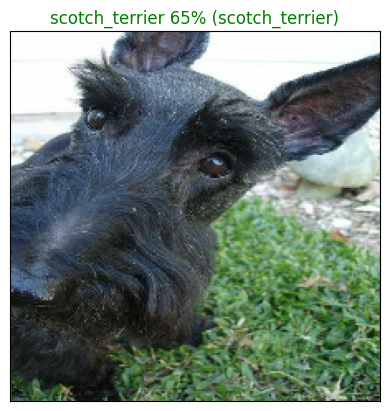

In [144]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

**Let's build a function to demonstrate. The function will:**

* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using get_pred_label().
* Find the top 10:
* Prediction probabilities indexes
* Prediction probabilities values
* Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [145]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

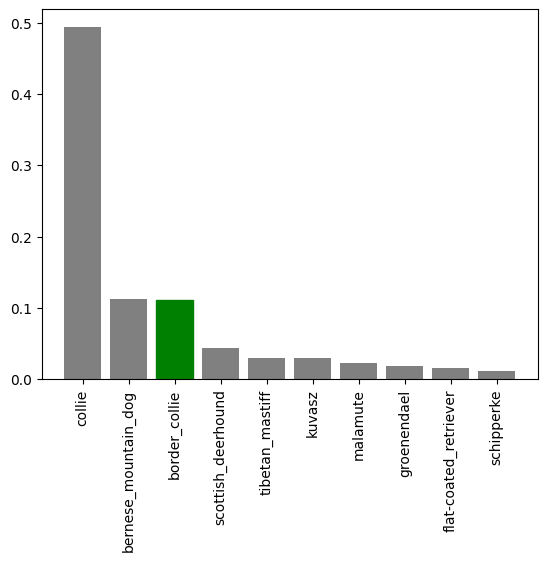

In [146]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

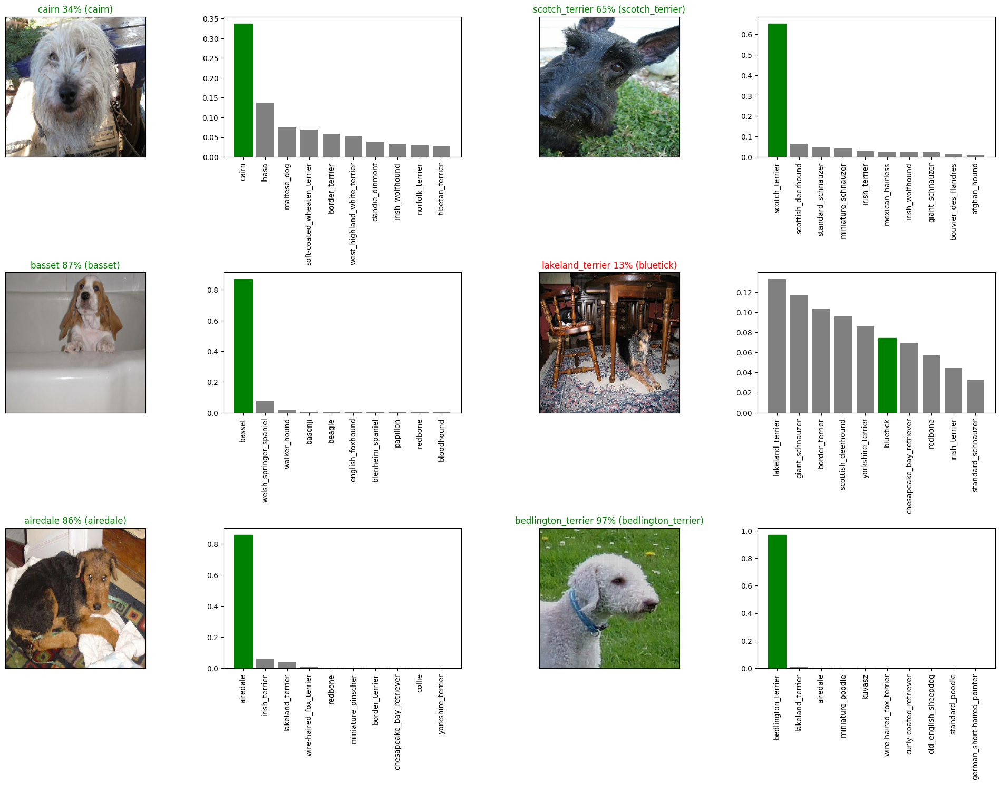

In [147]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# Saving and reloading a model

In [148]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [151]:
# Save our model trained on 1000 images
model.save(
    "drive/MyDrive/Data/models/20251229-15191767021558-1000-images-Adam.keras"
)


In [152]:
# to load the model later:
#import tensorflow as tf

#model = tf.keras.models.load_model(
 #   "drive/My Drive/Data/models/20251229-15191767021558-1000-images-Adam.keras"
#)


In [153]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.6897 - loss: 1.1390


[1.2192816734313965, 0.6949999928474426]

# Training a model (on the full data)

In [156]:
import tensorflow as tf

IMG_SIZE = (224, 224)

def process_image(image_path):
    """Reads an image from a file, decodes it into a dense tensor, resizes it and scales it."""
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, IMG_SIZE)         # <-- FIX: pass tuple
    image = tf.cast(image, tf.float32) / 255.0       # 0..1 (matches your model fix)
    return image

def get_image_label(image_path, label):
    """Returns (image, label) for a filepath and one-hot label."""
    image = process_image(image_path)
    label = tf.cast(label, tf.float32)               # <-- FIX: bool -> float32
    return image, label

# Turn full training data in a data batch
full_data = create_data_batches(X, y)

Creating training data batches...


In [157]:
batch_images, batch_labels = next(iter(full_data))
print(batch_images.shape, batch_images.dtype, batch_images.numpy().min(), batch_images.numpy().max())
print(batch_labels.shape, batch_labels.dtype)


(32, 224, 224, 3) <dtype: 'float32'> 0.0 1.0
(32, 120) <dtype: 'float32'>


In [158]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

In [159]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [161]:
%tensorboard --logdir drive/MyDrive/Data/logs

<IPython.core.display.Javascript object>

In [162]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 1510s 5s/step - accuracy: 0.4263 - loss: 2.6078
Epoch 2/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.8437 - loss: 0.5427
Epoch 3/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 40s 126ms/step - accuracy: 0.8973 - loss: 0.3535
Epoch 4/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9252 - loss: 0.2690
Epoch 5/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9427 - loss: 0.2071
Epoch 6/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.9599 - loss: 0.1642
Epoch 7/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9671 - loss: 0.1402
Epoch 8/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 128ms/step - accuracy: 0.9727 - loss: 0.1189
Epoch 9/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9786 - loss: 0.1007
Epoch 10/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9779 - loss: 0.0972
Epoch 11/100
320/320 ━━━━━━━━━━━━━━━━━━━━ 41s 127ms/step - accuracy: 0.9835 - loss: 0.0798
Epoch 12/

# Saving and reloading the full model

In [163]:
model.save(
    "/content/drive/MyDrive/Data/models/dog_breed_mobilenetv2.keras"
)


In [164]:
#import tensorflow as tf

#model = tf.keras.models.load_model(
#    "/content/drive/MyDrive/Data/models/dog_breed_mobilenetv2.keras"
#)


In [168]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "/content/drive/MyDrive/dog-breed-identification-2/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/dog-breed-identification-2/test/ab68d07a7fc0fced182ca02818e00cbf.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/9e7327c7131b0d388c20fb7b02bba04a.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/1c76500d219146c685ef03b6c5cc0065.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/debfa5cad80e35c510dff6ca29b94ca3.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/aa9bc4f11014bf85e32c254dda6dcb7f.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/25eb40f5ce2bbf43ec4432cfe9d15715.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/92873769f75c070f4990d7a6a1d9ac54.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/b67414380e9218f96f605f4eceef9fab.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/83bebb2fdb3e84f5a0bd19bb594718c5.jpg',
 '/content/drive/MyDrive/dog-breed-identification-2/test/d8ec8325742116ccff4fc25add62d003.jpg']

In [167]:
# How many test images are there?
len(test_filenames)

4348

In [169]:
test_data = create_data_batches(test_filenames, test_data=True)


Creating test data batches...


In [171]:
# Make predictions on test data batch using the loaded full model
import tensorflow as tf

loaded_full_model = tf.keras.models.load_model(
    "/content/drive/MyDrive/Data/models/dog_breed_mobilenetv2.keras"
)

test_predictions = loaded_full_model.predict(test_data, verbose=1)


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 4 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


136/136 ━━━━━━━━━━━━━━━━━━━━ 735s 5s/step


In [172]:
# Check out the test predictions
test_predictions[:10]

array([[1.21662466e-04, 2.34523595e-05, 2.86671129e-04, ...,
        1.20713717e-04, 1.00889811e-04, 6.41837978e-05],
       [5.49664110e-05, 3.63307016e-04, 1.55634235e-03, ...,
        7.88357034e-02, 6.03348017e-04, 4.81363495e-05],
       [1.68595521e-04, 5.75602462e-06, 4.28492494e-04, ...,
        1.12613205e-04, 6.22950975e-05, 6.64017643e-05],
       ...,
       [9.53987066e-04, 4.35246533e-04, 9.24744469e-04, ...,
        2.05167034e-05, 7.15536735e-05, 1.63899153e-03],
       [3.89608613e-05, 1.74405686e-05, 5.61356464e-05, ...,
        9.09639493e-06, 1.80463587e-06, 1.73023036e-05],
       [8.84491354e-02, 7.69368256e-04, 8.39594213e-06, ...,
        1.07008795e-07, 1.32342930e-05, 2.57397856e-04]], dtype=float32)

In [173]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [176]:
# Append test image ID's to predictions DataFrame
test_path = "/content/drive/MyDrive/dog-breed-identification-2/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ab68d07a7fc0fced182ca02818e00cbf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9e7327c7131b0d388c20fb7b02bba04a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1c76500d219146c685ef03b6c5cc0065,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,debfa5cad80e35c510dff6ca29b94ca3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,aa9bc4f11014bf85e32c254dda6dcb7f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [177]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ab68d07a7fc0fced182ca02818e00cbf,0.000122,0.000023,0.000287,0.000010,0.000005,1.548797e-07,0.000030,0.000009,0.000002,...,0.000126,8.611471e-08,4.800847e-06,0.000001,0.000025,0.000005,0.000168,0.000121,0.000101,0.000064
1,9e7327c7131b0d388c20fb7b02bba04a,0.000055,0.000363,0.001556,0.000045,0.000931,5.724036e-05,0.000113,0.008116,0.000050,...,0.000593,1.265221e-04,5.126050e-04,0.001995,0.002702,0.000041,0.000426,0.078836,0.000603,0.000048
2,1c76500d219146c685ef03b6c5cc0065,0.000169,0.000006,0.000428,0.000015,0.001957,9.013100e-06,0.000026,0.003923,0.000321,...,0.000098,1.020836e-03,7.280312e-07,0.000256,0.000006,0.000065,0.000049,0.000113,0.000062,0.000066
3,debfa5cad80e35c510dff6ca29b94ca3,0.000255,0.002391,0.000197,0.000340,0.000010,1.018110e-04,0.000624,0.004183,0.000403,...,0.000076,7.368673e-05,2.142060e-05,0.000072,0.000006,0.002037,0.000030,0.001401,0.003527,0.000267
4,aa9bc4f11014bf85e32c254dda6dcb7f,0.003133,0.000155,0.000270,0.000061,0.000064,9.322059e-06,0.000110,0.000121,0.000007,...,0.000127,1.335596e-05,1.152463e-05,0.000014,0.000011,0.000004,0.000156,0.000095,0.000179,0.000153


In [178]:
preds_df.to_csv("drive/MyDrive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)